# Introduction

In [1]:
!pip install librosa

In [2]:
!pip install librosa --index-url https://pypi.python.org/http://localhost:8888/notebooks/Tie_proj/Voice_classification-Copy1.ipynb#simple/

    

Looking in indexes: https://pypi.python.org/http://localhost:8888/notebooks/Tie_proj/Voice_classification-Copy1.ipynb#simple/


# Libraries

In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing
import seaborn as sns
import matplotlib.pyplot as plt
import librosa #the mother of audio files
import librosa.display
import IPython.display as ipd
import warnings
warnings.filterwarnings('ignore')
import os


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


In [4]:
music_data = pd.read_csv(r"C:\Users\nisar\Tie_proj\Data\features_30_sec.csv")
music_data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [5]:
music_data.shape

(1000, 60)

In [6]:
music_data = music_data.drop(labels = 'filename', axis = 1)

In [7]:
dup_rows = music_data[music_data.duplicated()]
print("Duplicate Rows :")
print(dup_rows)

Duplicate Rows :
     length  chroma_stft_mean  chroma_stft_var  rms_mean   rms_var  \
399  661504          0.440995         0.082474  0.122678  0.001555   
445  675808          0.392812         0.101583  0.184535  0.009066   
478  661504          0.424605         0.097809  0.237200  0.027679   
661  661794          0.509269         0.075232  0.104623  0.000568   
662  661794          0.456134         0.075901  0.097609  0.000364   
663  661794          0.436672         0.081374  0.093663  0.000385   
664  661794          0.438275         0.081817  0.090498  0.001114   
665  661794          0.469605         0.073267  0.095436  0.000590   
666  661794          0.430214         0.081088  0.088064  0.000997   
694  661504          0.406933         0.083121  0.090511  0.000614   
760  661504          0.390280         0.099812  0.273480  0.015230   
771  661504          0.447251         0.093025  0.191522  0.007824   
882  661504          0.473389         0.092889  0.179540  0.010025   

  

In [8]:
music_data = music_data.drop_duplicates()

In [9]:
# We find that the column filename is deleted
music_data.shape

(987, 59)

In [10]:
music_data

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,661794,0.352063,0.080487,0.079486,0.000345,2008.149458,282174.689224,2106.541053,88609.749506,4253.557033,...,45.050526,-13.289984,41.754955,2.484145,36.778877,-6.713265,54.866825,-1.193787,49.950665,rock
996,661794,0.398687,0.075086,0.076458,0.000588,2006.843354,182114.709510,2068.942009,82426.016726,4149.338328,...,33.851742,-10.848309,39.395096,1.881229,32.010040,-7.461491,39.196327,-2.795338,31.773624,rock
997,661794,0.432142,0.075268,0.081651,0.000322,2077.526598,231657.968040,1927.293153,74717.124394,4031.405321,...,33.597008,-12.845291,36.367264,3.440978,36.001110,-12.588070,42.502201,-2.106337,29.865515,rock
998,661794,0.362485,0.091506,0.083860,0.001211,1398.699344,240318.731073,1818.450280,109090.207161,3015.631004,...,46.324894,-4.416050,43.583942,1.556207,34.331261,-5.041897,47.227180,-3.590644,41.299088,rock


In [11]:
# Features in our dataset
music_data.dtypes

length                       int64
chroma_stft_mean           float64
chroma_stft_var            float64
rms_mean                   float64
rms_var                    float64
spectral_centroid_mean     float64
spectral_centroid_var      float64
spectral_bandwidth_mean    float64
spectral_bandwidth_var     float64
rolloff_mean               float64
rolloff_var                float64
zero_crossing_rate_mean    float64
zero_crossing_rate_var     float64
harmony_mean               float64
harmony_var                float64
perceptr_mean              float64
perceptr_var               float64
tempo                      float64
mfcc1_mean                 float64
mfcc1_var                  float64
mfcc2_mean                 float64
mfcc2_var                  float64
mfcc3_mean                 float64
mfcc3_var                  float64
mfcc4_mean                 float64
mfcc4_var                  float64
mfcc5_mean                 float64
mfcc5_var                  float64
mfcc6_mean          

In [12]:
# Different Genre in the dataset
music_data['label'].value_counts()

label
blues        100
classical    100
country      100
jazz         100
rock         100
disco         99
reggae        99
hiphop        98
pop           98
metal         93
Name: count, dtype: int64

In [13]:
file_path = r"C:\Users\nisar\Tie_proj\Data"
print(os.listdir(f'{file_path}/genres_original/'))


['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


# Recce on audio

1.Sound: sequence of vibrations in varying pressure strengths (y)
2.The sample rate (sr) is the number of samples of audio carried per second, measured in Hz or kHz

In [14]:
# Importing 1 file
y, sr = librosa.load(f'{file_path }/genres_original/reggae/reggae.00036.wav')

print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

# Verify length of the audio
print('Check Len of Audio:', 661794/22050)

y: [0.02072144 0.04492188 0.05422974 ... 0.06912231 0.08303833 0.08572388] 

y shape: (661794,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 30.013333333333332


In [15]:
# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
audio_file, _ = librosa.effects.trim(y)

# the result is an numpy ndarray
print('Audio File:', audio_file, '\n')
print('Audio File shape:', np.shape(audio_file))

Audio File: [0.02072144 0.04492188 0.05422974 ... 0.06912231 0.08303833 0.08572388] 

Audio File shape: (661794,)


In [16]:
music_classic = 'classical.00005.wav'
print('Playing : ', music_classic)
ipd.Audio(r"C:\Users\nisar\Tie_proj\Data\genres_original\classical\classical.00005.wav")

Playing :  classical.00005.wav


In [17]:
sound, sample_rate = librosa.load(f'{file_path}\genres_original\classical\classical.00005.wav')

In [18]:
sound[:5]

array([-0.02459717, -0.04446411, -0.04428101, -0.05108643, -0.05322266],
      dtype=float32)

In [19]:
sample_rate

22050

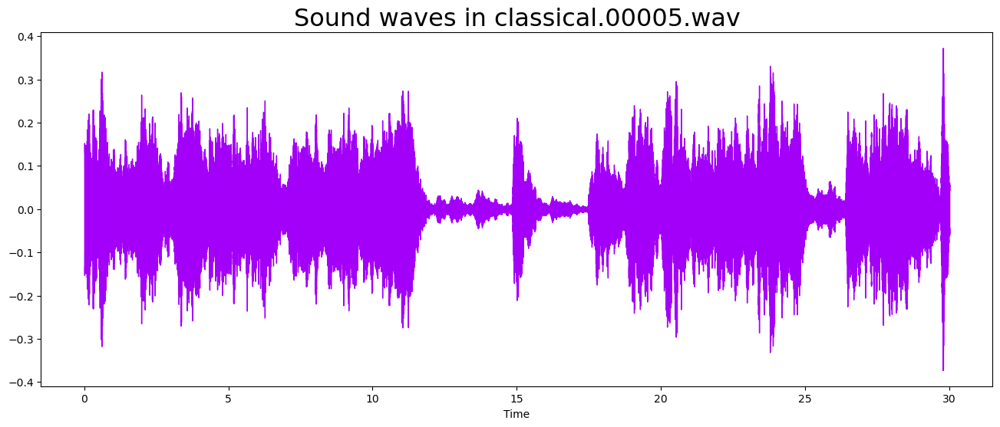

In [20]:
plt.figure(figsize=(16, 6))
librosa.display.waveshow(y=sound, sr=sample_rate, color="#A300F9")
plt.title("Sound waves in classical.00005.wav", fontsize=23)  
plt.show()

In [21]:
music_rock = 'rock.00017.wav'
print('Playing : ', music_rock)
ipd.Audio(filename=file_path+r"\genres_original\rock\rock.00017.wav")

Playing :  rock.00017.wav


In [22]:
sound_rock, sample_rate_rock = librosa.load(f'{file_path}/genres_original/rock/rock.00017.wav')


In [23]:
sound_rock[:5]

array([-0.01455688, -0.06048584, -0.02310181,  0.02371216, -0.03018188],
      dtype=float32)

In [24]:
sample_rate_rock


22050

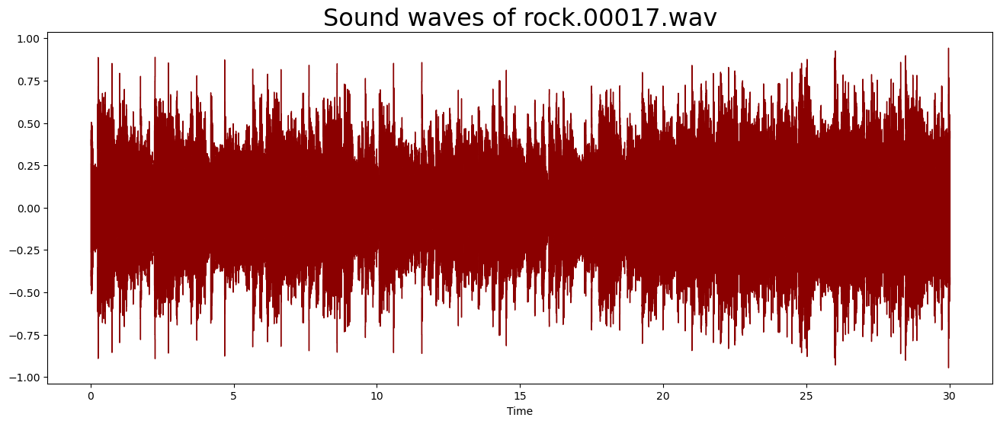

In [25]:
plt.figure(figsize = (16,6))
librosa.display.waveshow(y = sound_rock, sr = sample_rate_rock, color = 'darkred')
plt.title('Sound waves of rock.00017.wav',fontsize=23)
plt.show()

#Fourier Transform

Function that gets a signal in the time domain as input, and outputs its decomposition into frequencies

In [26]:
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(sound, n_fft = n_fft, hop_length = hop_length))

print('Shape of D object:', np.shape(D))

Shape of D object: (1025, 1293)


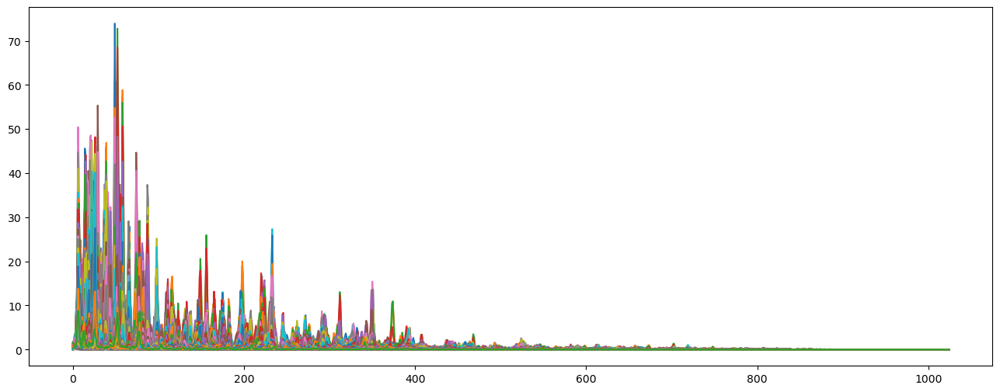

In [27]:
plt.figure(figsize = (16, 6))
plt.plot(D);

In [28]:
n_fft = 2048 
hop_length = 512 

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(sound_rock, n_fft = n_fft, hop_length = hop_length))

print('Shape of D object:', np.shape(D))

Shape of D object: (1025, 1293)


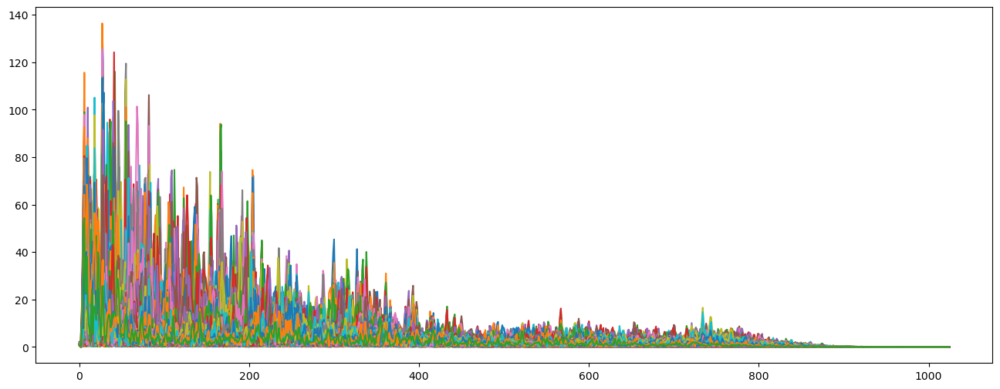

In [29]:
plt.figure(figsize = (16, 6))
plt.plot(D);


The Spectrogram

A spectrogram is a visual representation of the spectrum of frequencies of a signal as it varies with time. When applied to an audio signal, spectrograms are sometimes called sonographs, voiceprints, or voicegrams

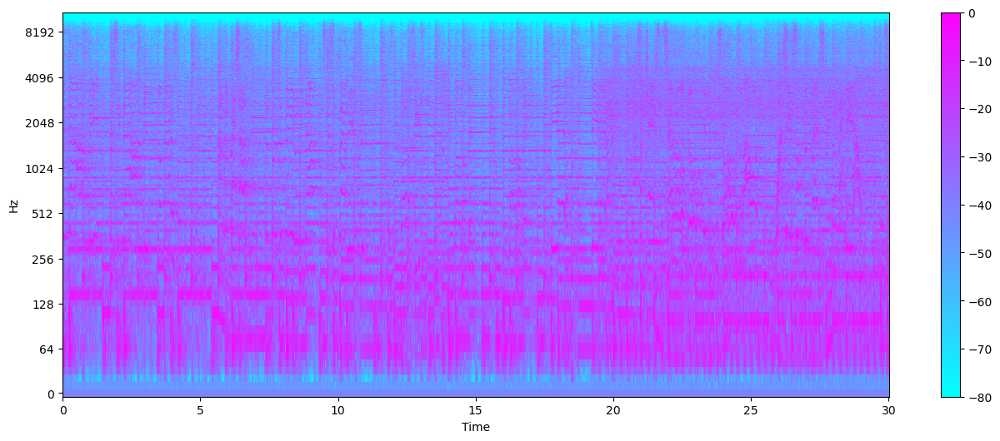

In [30]:
# Convert an amplitude spectrogram to Decibels-scaled spectrogram.
db = librosa.amplitude_to_db(D, ref= np.max)
# Creating the Spectogram
plt.figure(figsize = (16,6))
librosa.display.specshow(db, sr=sample_rate, hop_length= hop_length, x_axis='time', y_axis='log', cmap='cool')
plt.colorbar()
plt.show()

# Audio features

Zero Crossing Rate

1.the rate at which the signal changes from positive to negative or back.

In [31]:
zc_rock = librosa.zero_crossings(sound_rock, pad = False)
sum(zc_rock)

93137

In [32]:
zc_classical = librosa.zero_crossings(sound, pad= False)
sum(zc_classical)

49844

# Tempo BMP (beats per minute)

Dynamic programming beat tracker.

In [33]:
tempo_rock = librosa.beat.tempo(y=sound_rock, sr=sample_rate_rock)
print(tempo_rock)

[123.046875]


In [34]:
tempo_classical = librosa.beat.tempo(y=sound, sr = sample_rate)
print(tempo_classical)

[143.5546875]


# Chroma Frequencies

1.Chroma features are an interesting and powerful representation for music audio in which the entire spectrum is projected onto 12 bins representing the 12 distinct semitones (or chroma) of the musical octave.

Chromogram shape: (12, 67)


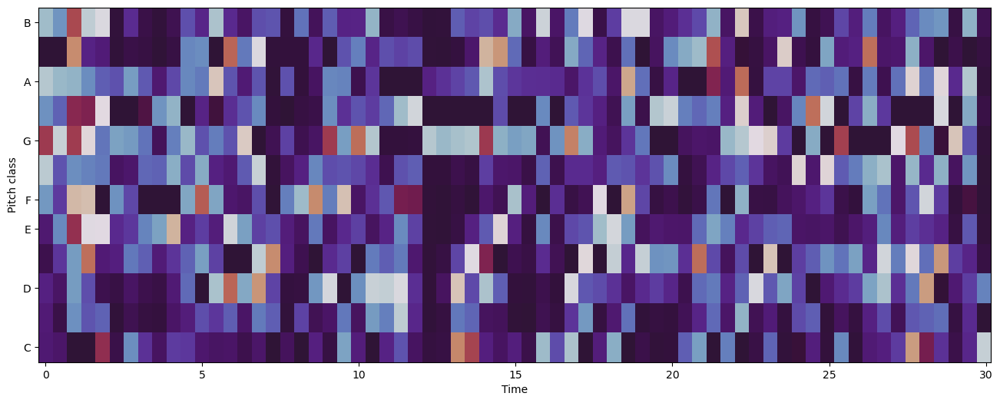

In [35]:
# Increase or decrease hop_length to change how granular you want your data to be
hop_length = 5000
# Chromogram
chromagram = librosa.feature.chroma_stft(y=sound, sr=sample_rate, hop_length=10000)
print('Chromogram shape:', chromagram.shape)
plt.figure(figsize=(16, 6))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=10000, cmap='twilight_shifted');

Chromogram shape: (12, 34)


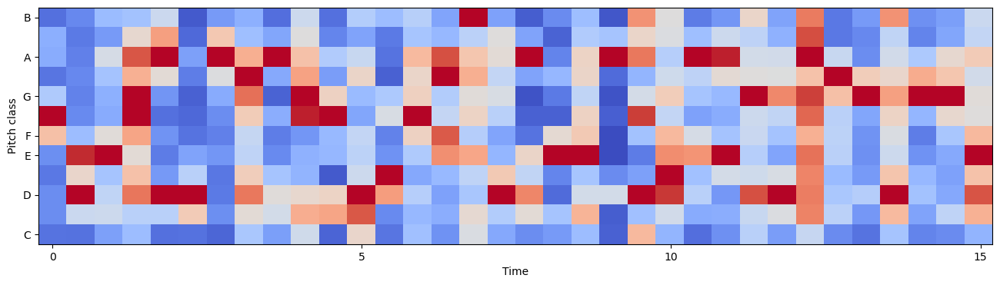

In [36]:
hop_length= 600

chromagram = librosa.feature.chroma_stft(y=sound_rock, sr=sample_rate_rock, hop_length=20000)
print('Chromogram shape:', chromagram.shape)
plt.figure(figsize=(16, 4))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=10000, cmap='coolwarm');


# features_30_sec.csv
This file contains the mean and variance for each audio file fo the features analysed above.

In [37]:
pd.set_option('display.max_columns', 60)
df = pd.read_csv(f'{file_path}/features_30_sec.csv')
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,0.083045,0.000767,-4.529724e-05,0.008172,0.000008,0.005698,123.046875,-113.570648,2564.207520,121.571793,295.913818,-19.168142,235.574432,42.366421,151.106873,-6.364664,167.934799,18.623499,89.180840,-13.704891,67.660492,15.343150,68.932579,-12.274110,82.204201,10.976572,63.386311,-8.326573,61.773094,8.803792,51.244125,-3.672300,41.217415,5.747995,40.554478,-5.162882,49.775421,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,0.056040,0.001448,1.395807e-04,0.005099,-0.000178,0.003063,67.999589,-207.501694,7764.555176,123.991264,560.259949,8.955127,572.810913,35.877647,264.506104,2.907320,279.932922,21.510466,156.477097,-8.560436,200.849182,23.370686,142.555954,-10.099661,166.108521,11.900497,104.358612,-5.555639,105.173630,5.376327,96.197212,-2.231760,64.914291,4.220140,73.152534,-6.012148,52.422142,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,0.076291,0.001007,2.105576e-06,0.016342,-0.000019,0.007458,161.499023,-90.722595,3319.044922,140.446304,508.765045,-29.093889,411.781219,31.684334,144.090317,-13.984504,155.493759,25.764742,74.548401,-13.664875,106.981827,11.639934,106.574875,-11.783643,65.447945,9.718760,67.908859,-13.133803,57.781425,5.791199,64.480209,-8.907628,60.385151,-1.077000,57.711136,-9.229274,36.580986,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,0.033309,0.000423,4.583644e-07,0.019054,-0.000014,0.002712,63.024009,-199.544205,5507.517090,150.090897,456.505402,5.662678,257.161163,26.859079,158.267303,1.771399,268.034393,14.234031,126.794128,-4.832006,155.912079,9.286494,81.273743,-0.759186,92.114090,8.137607,71.314079,-3.200653,110.236687,6.079319,48.251999,-2.480174,56.799400,-1.079305,62.289902,-2.870789,51.651592,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,0.101461,0.001954,-1.756129e-05,0.004814,-0.000010,0.003094,135.999178,-160.337708,5195.291992,126.219635,853.784729,-35.587811,333.792938,22.148071,193.456100,-32.478600,336.276825,10.852294,134.831573,-23.352329,93.257095,0.498434,124.672127,-11.793437,130.073349,1.207256,99.675575,-13.088418,80.254066,-2.813867,86.430626,-6.933385,89.555443,-7.552725,70.943336,-9.164666,75.793404,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [38]:
df.shape

(1000, 60)

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   filename                 1000 non-null   object 
 1   length                   1000 non-null   int64  
 2   chroma_stft_mean         1000 non-null   float64
 3   chroma_stft_var          1000 non-null   float64
 4   rms_mean                 1000 non-null   float64
 5   rms_var                  1000 non-null   float64
 6   spectral_centroid_mean   1000 non-null   float64
 7   spectral_centroid_var    1000 non-null   float64
 8   spectral_bandwidth_mean  1000 non-null   float64
 9   spectral_bandwidth_var   1000 non-null   float64
 10  rolloff_mean             1000 non-null   float64
 11  rolloff_var              1000 non-null   float64
 12  zero_crossing_rate_mean  1000 non-null   float64
 13  zero_crossing_rate_var   1000 non-null   float64
 14  harmony_mean             

In [40]:
df.columns

Index(['filename', 'length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean',
       'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var',
  

In [41]:
df.label.unique()

array(['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz',
       'metal', 'pop', 'reggae', 'rock'], dtype=object)

# Box Plot for Genres Distributions

In [42]:
df.tempo[:20]

0     123.046875
1      67.999589
2     161.499023
3      63.024009
4     135.999178
5      69.837416
6      71.777344
7      92.285156
8      83.354335
9      80.749512
10    161.499023
11    161.499023
12    184.570312
13    107.666016
14    151.999081
15     99.384014
16    198.768029
17    172.265625
18     83.354335
19    123.046875
Name: tempo, dtype: float64

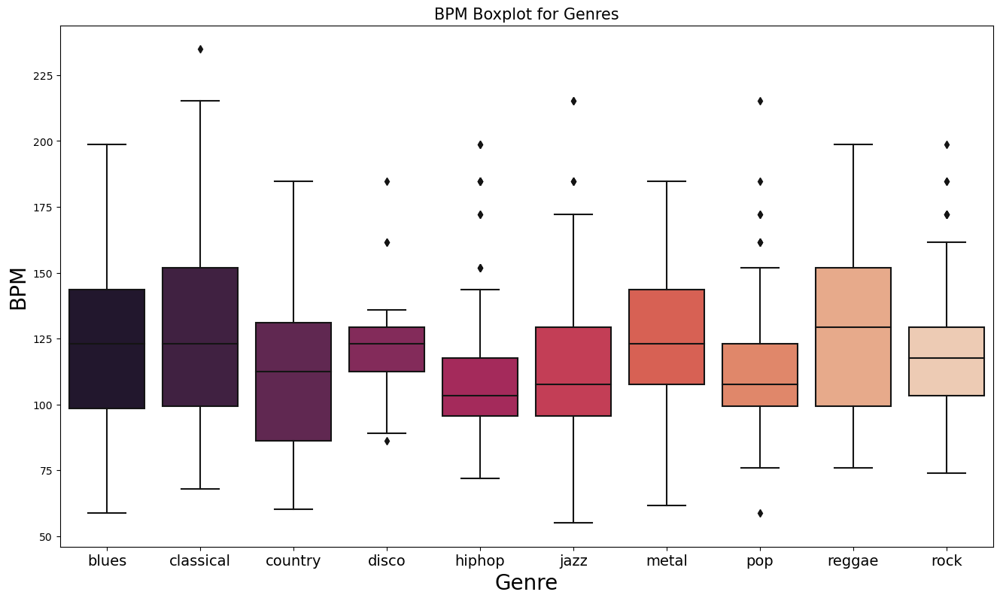

In [43]:
label_tempo_df= df[['label', 'tempo']]

f, ax = plt.subplots(figsize = (16,9))
sns.boxplot(x = 'label', y = 'tempo', data = label_tempo_df, palette = 'rocket' )

plt.title('BPM Boxplot for Genres', fontsize = 15)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10)
plt.xlabel('Genre', fontsize = 20)
plt.ylabel('BPM', fontsize = 20)
plt.show()

# Correlation Heatmap for feature means

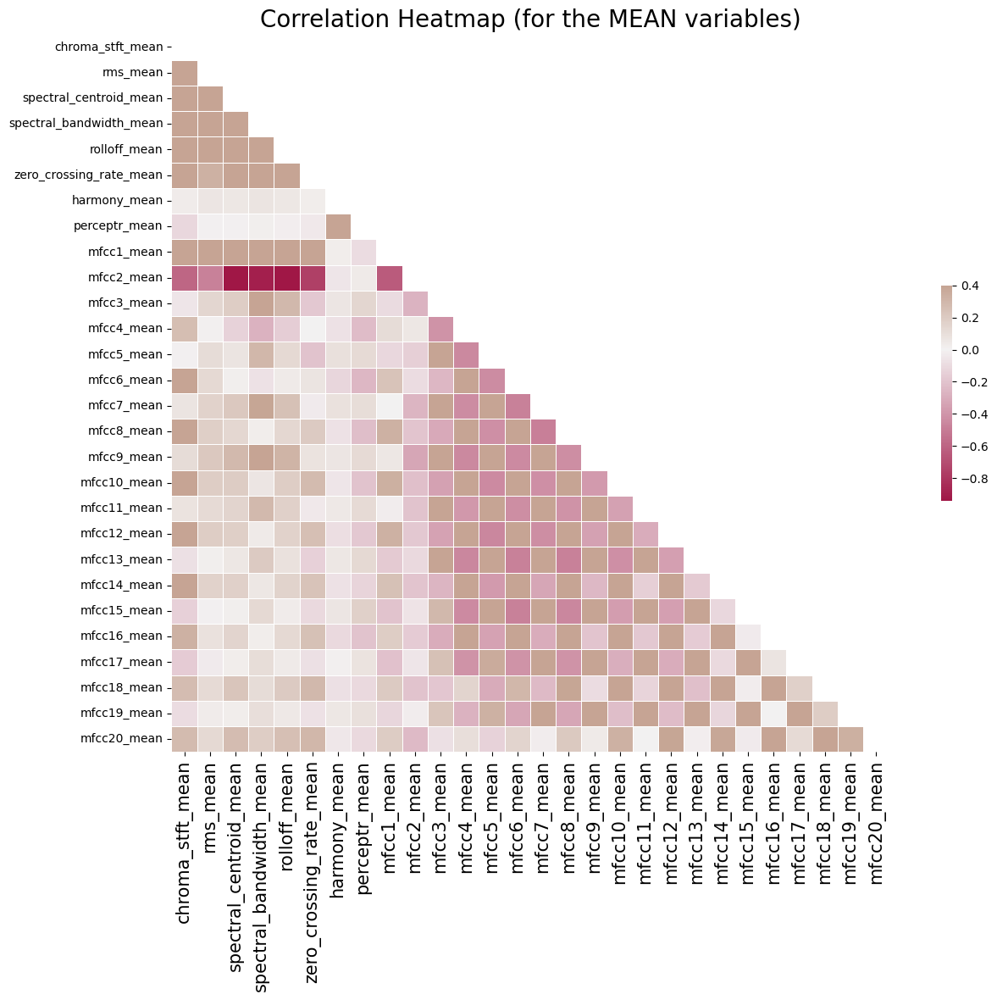

In [44]:
# Computing the Correlation Matrix
spike_cols = [col for col in df.columns if 'mean' in col]
corr = df[spike_cols].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 11));

# Generate a custom diverging colormap
cmap = sns.diverging_palette(0, 25, as_cmap=True, s = 90, l = 35, n = 5)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.4, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .3})

plt.title('Correlation Heatmap (for the MEAN variables)', fontsize = 20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 10);
plt.savefig("Corr Heatmap.jpg")

In [45]:
selected_rows_rock = df[(df['label'] == 'rock') & (df['tempo'] > 175)]
selected_rows_rock[['filename','label', 'tempo']]

,filename,label,tempo
921,rock.00021.wav,rock,184.570312
922,rock.00022.wav,rock,198.768029
985,rock.00085.wav,rock,184.570312


In [46]:
print('Outlier Rock Songs over 175 Tempo :\n\n')
for i in selected_rows_rock.filename:
    print(i+'\n')
    display(ipd.Audio(filename=file_path+'/genres_original/rock/'+i))

Outlier Rock Songs over 175 Tempo :


rock.00021.wav



rock.00022.wav



rock.00085.wav



In [47]:
selected_rows_pop = df[(df['label'] == 'pop') & (df['tempo'] < 75)]
selected_rows_pop[['filename','label', 'tempo']]

,filename,label,tempo
749,pop.00049.wav,pop,58.726918


In [48]:
print('Outlier Pop Songs under 75 Tempo :\n\n')
for i in selected_rows_pop.filename:
    print(i+'\n')
    display(ipd.Audio(filename=file_path+'/genres_original/pop/'+i))


Outlier Pop Songs under 75 Tempo :


pop.00049.wav



# Principal Component Analysis - to visualize possible groups of genres

In [49]:
from sklearn import preprocessing

data = df.iloc[0:, 1:]
y = data['label']
X = data.drop('label', axis = 1)

cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns = cols)

from sklearn.decomposition import PCA

pca = PCA(n_components = 2)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

finalDf = pd.concat([principalDf, y], axis = 1)
print('variance ratio : ', pca.explained_variance_ratio_)
print('sum : ', sum(pca.explained_variance_ratio_))


variance ratio :  [0.2439355  0.21781804]
sum :  0.4617535410562956


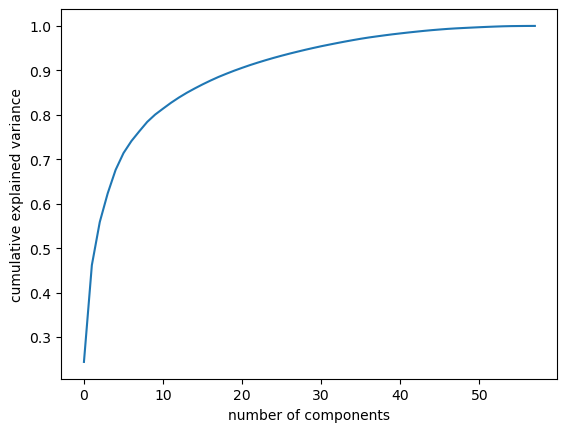

In [50]:
pca = PCA(whiten = True).fit(X)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [51]:
principalComponents

array([[-0.39482692, -0.11501494],
       [ 0.05068414, -0.27107149],
       [-0.47996939, -0.22316948],
       ...,
       [-0.84539177, -0.00462221],
       [-0.23574387, -0.37205073],
       [-0.40011842, -0.27539794]])

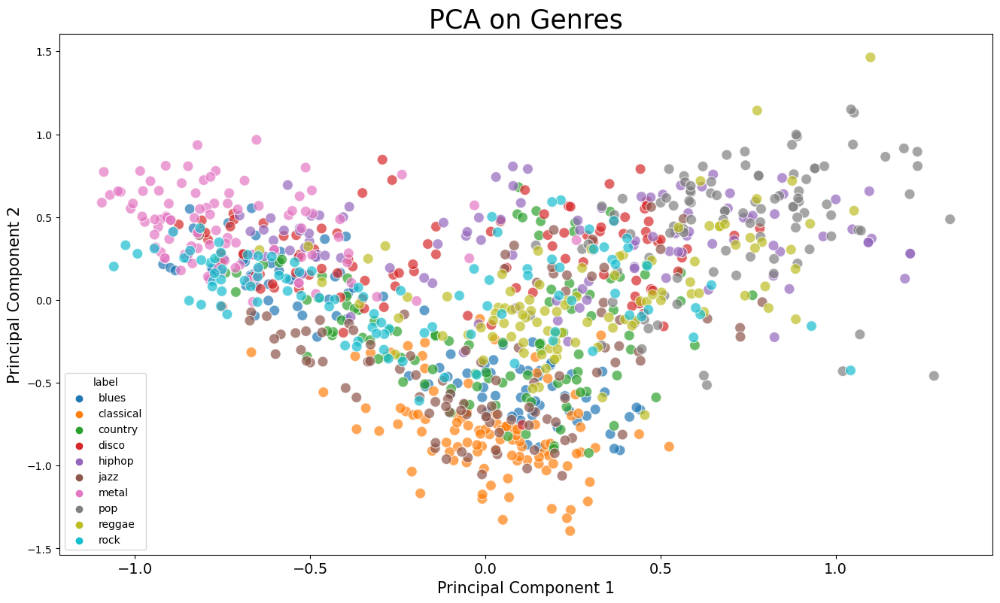

In [52]:
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

# concatenate with target label
finalDf = pd.concat([principalDf, y], axis = 1)


plt.figure(figsize = (16, 9))
sns.scatterplot(x = "principal component 1", y = "principal component 2", data = finalDf, hue = "label", alpha = 0.7,
               s = 100);

plt.title('PCA on Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Principal Component 1", fontsize = 15)
plt.ylabel("Principal Component 2", fontsize = 15)
plt.savefig("PCA Scattert.jpg")



# Machine Learning Classification
1.Support Vector Machine (Provided)

2.K Nearest Neighbor (Provided)

3.XG Boost Accuracy (Provided)

4.Decision Tree Accuracy

5.Naive Bayes Accuracy

6.SVR Mean Squared Error

7.Convolutional Neural Network

In [53]:
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split as tts
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve, precision_score, recall_score, f1_score
from sklearn.feature_selection import RFE

In [54]:
data = pd.read_csv(r"C:\Users\nisar\Tie_proj\Data\features_3_sec.csv")
data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,1.080790e+06,0.081851,0.000558,-0.000078,0.008354,-0.000068,0.005535,129.199219,-118.627914,2440.286621,125.083626,260.956909,-23.443724,364.081726,41.321484,181.694855,-5.976108,152.963135,20.115141,75.652298,-16.045410,40.227104,17.855198,84.320282,-14.633434,83.437233,10.270527,97.001335,-9.708279,66.669891,10.183875,45.103611,-4.681614,34.169498,8.417439,48.269444,-7.233477,42.770947,-2.853603,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,6.722448e+05,0.087173,0.001030,-0.000099,0.004950,-0.000103,0.004854,123.046875,-125.590706,2038.344238,122.421227,216.774185,-20.718019,231.979767,50.128387,142.700409,-11.333302,139.243118,21.385401,77.817947,-15.960796,97.364029,19.454103,57.948093,-12.465918,68.271523,17.898169,56.222176,-11.732554,54.373909,8.145000,40.662876,-7.717751,30.808521,8.397150,48.784225,-8.300493,68.584824,4.074709,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,7.907127e+05,0.071383,0.000425,-0.000066,0.012476,0.000065,0.004357,123.046875,-132.441940,3798.532227,115.085175,257.321289,-14.811666,192.448074,50.189293,144.166031,-0.680819,128.376892,24.650375,66.371170,-13.506104,89.319336,15.643386,55.253967,-13.216637,120.308784,10.406025,35.757862,-7.991465,47.911613,11.853963,36.569931,-4.677677,40.725075,6.571110,30.686846,-2.424750,50.313499,4.806280,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,9.216524e+05,0.069426,0.000304,-0.000014,0.008318,0.000018,0.005927,123.046875,-118.231087,2508.781006,132.116501,332.650574,-18.758335,109.357529,39.769306,184.693344,-13.260426,144.398224,20.468134,122.516464,-14.563448,68.937332,18.745104,74.748886,-13.755463,73.868576,12.993759,41.549564,-12.648887,58.540478,10.389314,39.102024,-4.362739,60.714748,9.156193,40.411537,-9.889441,44.666325,-1.359111,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,6.102111e+05,0.070095,0.000289,0.000041,0.009634,-0.000106,0.005833,123.046875,-105.968376,2118.919922,134.643646,219.562622,-19.961748,171.878754,40.171753,103.120712,-14.271939,102.651230,18.734617,79.070000,-15.619381,48.510284,19.207966,53.642956,-18.274683,95.300995,14.316693,58.821163,-5.792194,55.030254,17.045437,43.229939,-5.681399,46.515259,5.705521,24.956211,-7.986080,39.816933,2.092937,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [55]:
!pip install xgboost

# Test and Train

In [56]:
df = data.iloc[0:, 2:]
y = df.label.values
X = df.drop('label', axis = 1)
X_columns = X.columns
scale = MinMaxScaler()
scaled_data = scale.fit_transform(X)
X = pd.DataFrame(scaled_data, columns = X_columns).values

#Splitting the data into training and testing
70% - 30% split

In [57]:
def model_build(model, kf, title = "Default"):
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy_scores.append(accuracy_score(y_test, y_pred))
    print("Accuracy score of", title, "is:", round(np.mean(accuracy_scores), 2))
    # Let's see the confusion matrix of the last split for a little insight
    con_mat = confusion_matrix(y_test, y_pred)
    plt.figure(figsize = (16, 9))
    sns.heatmap(con_mat, cmap="Blues", annot=True, 
                xticklabels = ["blues", "classical", "country", "disco", 
                               "hiphop", "jazz", "metal", "pop", "reggae", "rock"], 
                yticklabels=["blues", "classical", "country", "disco", "hiphop", 
                             "jazz", "metal", "pop", "reggae", "rock"])
    plt.show()

In [58]:
split = KFold(n_splits=5, shuffle=True)


#1.Support Vector Machine

Accuracy score of Support Vector Machine is: 0.76


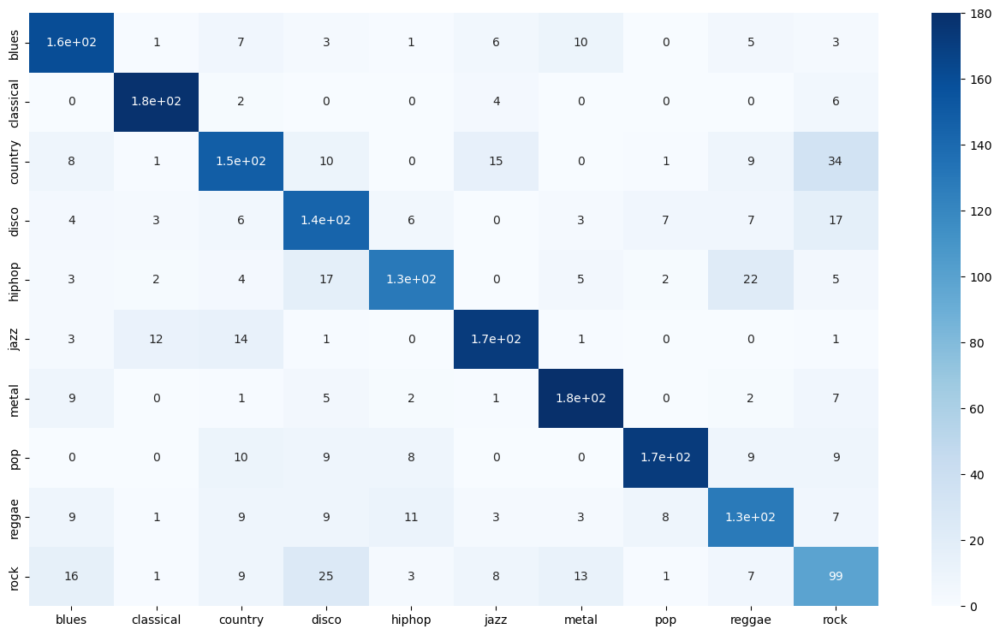

In [59]:
#confusion matrix
svm = SVC(decision_function_shape="ovo")
model_build(svm, split, 'Support Vector Machine')

 #2.K Nearest Neighbor

Accuracy score of K Nearest Neighbor is: 0.87


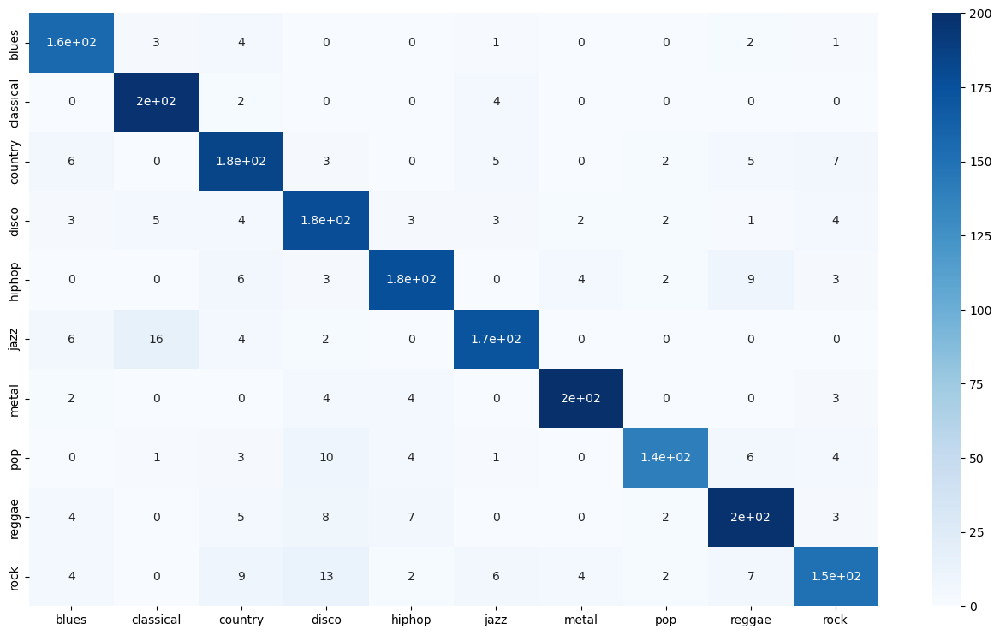

In [60]:
#confusion matrix
knn = KNeighborsClassifier(n_neighbors=10)
model_build(knn, split, 'K Nearest Neighbor')

#3.XG Boost

Accuracy score of XG Boost is: 0.9


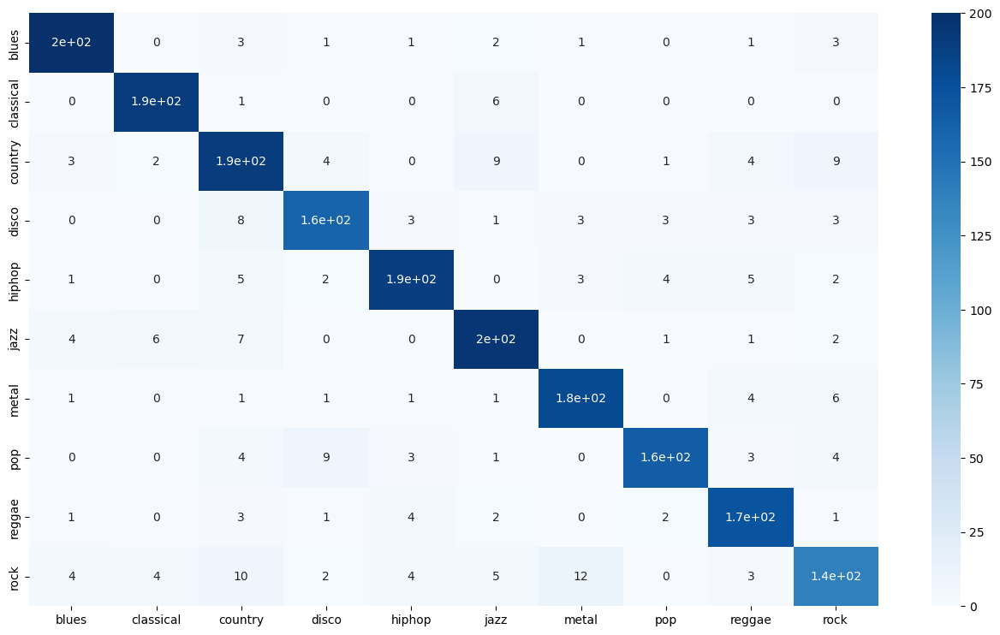

In [61]:
from sklearn.preprocessing import LabelEncoder

def model_build_xgb(model, kf, title = "Default"):
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y_encoded[train_index], y_encoded[test_index]
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy_scores.append(accuracy_score(y_test, y_pred))
        y_pred_labels = label_encoder.inverse_transform(y_pred)

    print("Accuracy score of", title, "is:", round(np.mean(accuracy_scores), 2))
    # Let's see the confusion matrix of the last split for a little insight
    con_mat = confusion_matrix(y_test, y_pred)
    plt.figure(figsize = (16, 9))
    sns.heatmap(con_mat, cmap="Blues", annot=True, 
                xticklabels = ["blues", "classical", "country", "disco", 
                               "hiphop", "jazz", "metal", "pop", "reggae", "rock"], 
                yticklabels=["blues", "classical", "country", "disco", "hiphop", 
                             "jazz", "metal", "pop", "reggae", "rock"])
    plt.show()
    
# confusion matrix
xgb = XGBClassifier()
model_build_xgb(xgb, split, 'XG Boost')

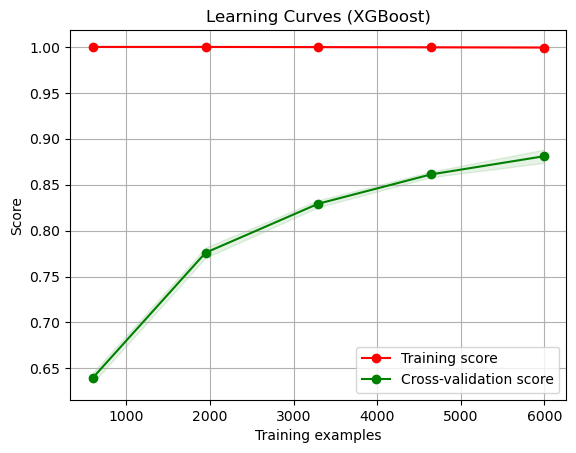

In [64]:
#Learning curve
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    """
    Generate a simple plot of the test and training learning curve.

    Parameters
    ----------
    estimator : object type that implements the "fit" and "predict" methods
        An object of that type which is cloned for each validation.

    title : string
        Title for the chart.

    X : array-like, shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and
        n_features is the number of features.

    y : array-like, shape (n_samples) or (n_samples, n_features), optional
        Target relative to X for classification or regression;
        None for unsupervised learning.

    ylim : tuple, shape (ymin, ymax), optional
        Defines minimum and maximum yvalues plotted.

    cv : int, cross-validation generator or an iterable, optional
        Determines the cross-validation splitting strategy.
        Possible inputs for cv are:
          - None, to use the default 5-fold cross-validation,
          - integer, to specify the number of folds.
          - :term:`CV splitter`,
          - An iterable yielding (train, test) splits as arrays of indices.

        For integer/None inputs, if ``y`` is binary or multiclass,
        :class:`StratifiedKFold` used. If the estimator is not a classifier
        or if ``y`` is neither binary nor multiclass, :class:`KFold` is used.

        Refer :ref:`User Guide <cross_validation>` for the various
        cross-validators that can be used here.

    n_jobs : int or None, optional (default=None)
        Number of jobs to run in parallel.
        ``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.
        ``-1`` means using all processors. See :term:`Glossary <n_jobs>`
        for more details.

    train_sizes : array-like, shape (n_ticks,), dtype float or int
        Relative or absolute numbers of training examples that will be used to
        generate the learning curve. If the dtype is float, it is regarded as a
        fraction of the maximum size of the training set (that is determined
        by the selected validation method), i.e. it has to be within (0, 1].
        Otherwise, it is interpreted as absolute sizes of the training sets.
        Note that for classification the number of samples usually have to
        be big enough to contain at least one sample from each class.
        (default: np.linspace(0.1, 1.0, 5))
    """
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt


# Now you can use y_encoded in your learning curve plot
title = "Learning Curves (XGBoost)"
plot_learning_curve(xgb, title, X_train, y_train, cv=split)

plt.show()


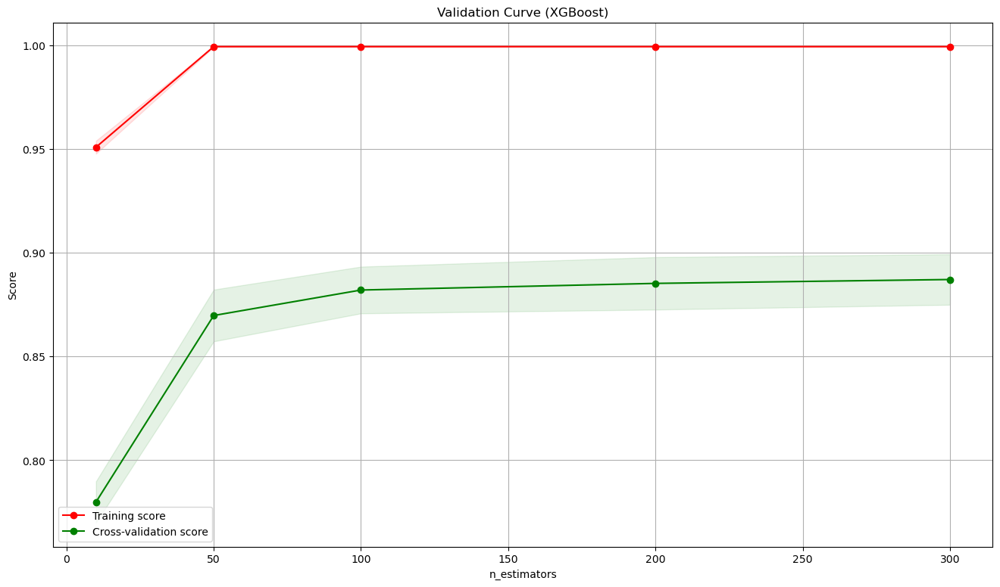

In [65]:
#Validation curve
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import validation_curve

def plot_validation_curve(estimator, title, X, y, param_name, param_range, ylim=None, cv=None, n_jobs=None):
    plt.figure(figsize=(16, 9))
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel(param_name)
    plt.ylabel("Score")

    train_scores, test_scores = validation_curve(
        estimator, X, y, param_name=param_name, param_range=param_range,
        cv=cv, n_jobs=n_jobs)

    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.grid()

    plt.fill_between(param_range, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(param_range, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(param_range, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(param_range, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Assuming you have X and y defined before this point
# split should be defined as well

xgb = XGBClassifier()

# Define the parameter and its range for the validation curve
param_name = 'n_estimators'
param_range = [10, 50, 100, 200, 300]  # Adjust this based on your specific hyperparameter

title = "Validation Curve (XGBoost)"
plot_validation_curve(xgb, title, X_train, y_train, param_name, param_range, cv=split)

plt.show()


# 

#4.Decision Tree classifier

In [66]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have your features in X and target variable in y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

# Create and train a Decision Tree classifier
dt_classifier = DecisionTreeClassifier()
dt_classifier.fit(X_train, y_train)

# Make predictions
y_pred = dt_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Decision Tree Accuracy: {accuracy}")


Decision Tree Accuracy: 0.6756756756756757


Accuracy score of DecisionTreeClassifier is: 0.65


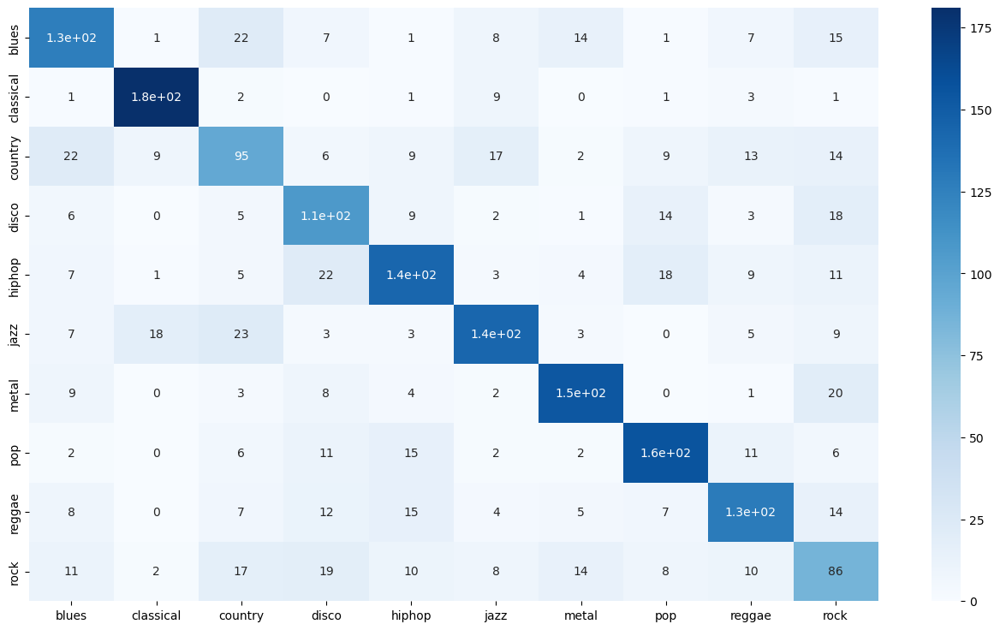

In [67]:
# confusion matrix
dt_classifier = DecisionTreeClassifier(
    criterion='gini',
    splitter='best',
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=None,
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    class_weight=None,
    ccp_alpha=0.0,)
model_build(dt_classifier, split, 'DecisionTreeClassifier')

#5.Naive Bayes Accuracy

In [68]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have your features in X and target variable in y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

# Create and train a Naive Bayes classifier (Gaussian Naive Bayes for continuous features)
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, y_train)

# Make predictions
y_pred = nb_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Naive Bayes Accuracy: {accuracy}")


Naive Bayes Accuracy: 0.541041041041041


Accuracy score of GaussianNB is: 0.52


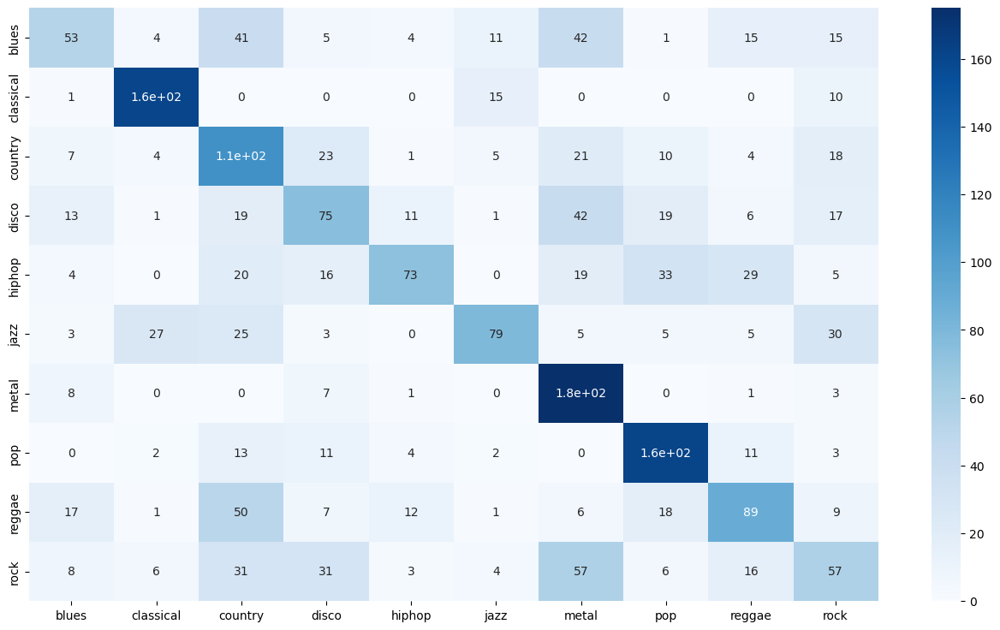

In [69]:
#confusion matrix
nb_classifier = GaussianNB(priors=None, var_smoothing=1e-09)
model_build(nb_classifier , split, 'GaussianNB')

#6.Support Vector Regression model

In [70]:
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler

# Assuming you have your features in X and target variable in y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

# Standardize features for SVR
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train a Support Vector Regression model
svr_model = SVR()
svr_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred = svr_model.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f"SVR Mean Squared Error: {mse}")


SVR Mean Squared Error: 3.516581124706344


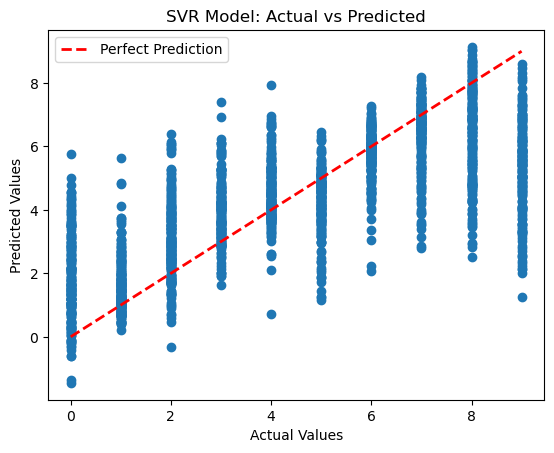

In [71]:
import matplotlib.pyplot as plt

# Scatter plot
plt.scatter(y_test, y_pred)
plt.title('SVR Model: Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

# Diagonal line
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red', linewidth=2, label='Perfect Prediction')

plt.legend()
plt.show()


#7.CNNs(Convolutional Neural Network)

In [72]:
!pip install tensorflow

In [73]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

height = 128
width = 128
channels = 3
num_classes=10
# Assuming input shape is spectrogram image
input_shape = (height, width, channels)

# Create CNN model
cnn_model = Sequential()
cnn_model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(Flatten())
cnn_model.add(Dense(128, activation='relu'))
cnn_model.add(Dense(num_classes, activation='softmax'))

# Compile the model
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
cnn_model.summary()






Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 64)        0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 57600)             0         
                                                                 
 dense (Dense)               (None, 128)            

In [74]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have your features in X and target variable in y
# Replace placeholder values with your actual data
X = np.random.rand(100, 128, 128, 3)  # Example data (replace with your actual data)
y = np.random.randint(0, 2, size=(100,))  # Example labels (replace with your actual labels)

# Assuming number of classes in your classification problem
num_classes = 2

# Assuming your labels are integers and you need to convert them to one-hot encoding
y_one_hot = to_categorical(y, num_classes=num_classes)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_one_hot, test_size=0.2, random_state=1)

# Define the model
height, width, channels = 128, 128, 3  # Replace with your actual image dimensions
input_shape = (height, width, channels)

cnn_model = Sequential()
cnn_model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(Flatten())
cnn_model.add(Dense(128, activation='relu'))
cnn_model.add(Dense(num_classes, activation='softmax'))

# Compile the model
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
cnn_model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

# Make predictions on the test set
y_pred = cnn_model.predict(X_test)

# Convert predictions back to class labels
y_pred_classes = y_pred.argmax(axis=-1)
y_test_classes = y_test.argmax(axis=-1)

# Evaluate accuracy
accuracy = accuracy_score(y_test_classes, y_pred_classes)
print(f"Accuracy: {accuracy}")


Epoch 1/10


2/2 [==============================] - 4s 874ms/step - loss: 11.7041 - accuracy: 0.5781 - val_loss: 6.5060 - val_accuracy: 0.3125
Epoch 2/10
2/2 [==============================] - 1s 309ms/step - loss: 2.7963 - accuracy: 0.6406 - val_loss: 1.8619 - val_accuracy: 0.6875
Epoch 3/10
2/2 [==============================] - 1s 315ms/step - loss: 2.9991 - accuracy: 0.4219 - val_loss: 0.9211 - val_accuracy: 0.6875
Epoch 4/10
2/2 [==============================] - 0s 308ms/step - loss: 1.3478 - accuracy: 0.4219 - val_loss: 0.6380 - val_accuracy: 0.6875
Epoch 5/10
2/2 [==============================] - 1s 315ms/step - loss: 0.7259 - accuracy: 0.4531 - val_loss: 0.8045 - val_accuracy: 0.3125
Epoch 6/10
2/2 [==============================] - 1s 315ms/step - loss: 0.6772 - accuracy: 0.5781 - val_loss: 0.7421 - val_accuracy: 0.3125
Epoch 7/10
2/2 [==============================] - 1s 315ms/step - loss: 0.6675 - accuracy: 0.5781 - val_loss: 0.7479 - val_accuracy: 0.3125
Epoch 8/10
2/2 [=

# XGBoost is the winner - 90% accuracy

1.Support Vector Machine Accuracy : 0.76


2.K Nearest Neighbor Accuracy : 0.87


3.XG Boost Accuracy : 0.91473


4.Decision Tree Accuracy: 0.6791791791791791


5.Naive Bayes Accuracy: 0.541041041041041


6.SVR Mean Squared Error: 3.516581124706344


7.Convolutional Neural Network Accuracy:0.75

# Data Visualization - Comparing the accuracy

1.Pie chart

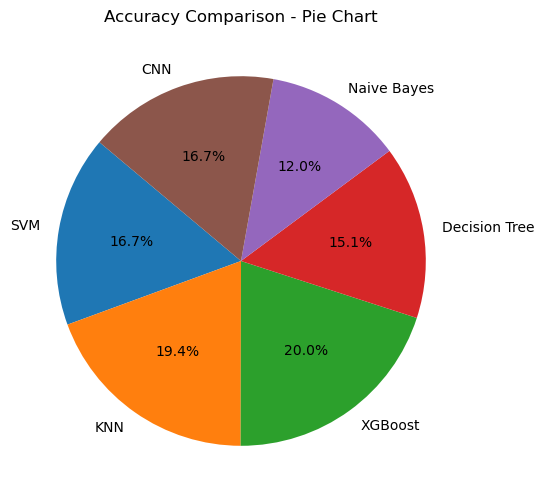

In [75]:
import matplotlib.pyplot as plt

# Assuming you have the accuracy values for each model
svm_accuracy = 0.75
knn_accuracy = 0.87
xgboost_accuracy = 0.90
decision_tree_accuracy = 0.68
naive_bayes_accuracy = 0.54
cnn_accuracy = 0.75

# Model names
model_names = ['SVM', 'KNN', 'XGBoost', 'Decision Tree', 'Naive Bayes', 'CNN']

# Accuracy values
accuracy_values = [svm_accuracy, knn_accuracy, xgboost_accuracy, decision_tree_accuracy, naive_bayes_accuracy, cnn_accuracy]

# Pie Chart
plt.figure(figsize=(10, 6))
plt.pie(accuracy_values, labels=model_names, autopct='%1.1f%%', startangle=140)
plt.title('Accuracy Comparison - Pie Chart')
plt.show()


2.Bar Graph

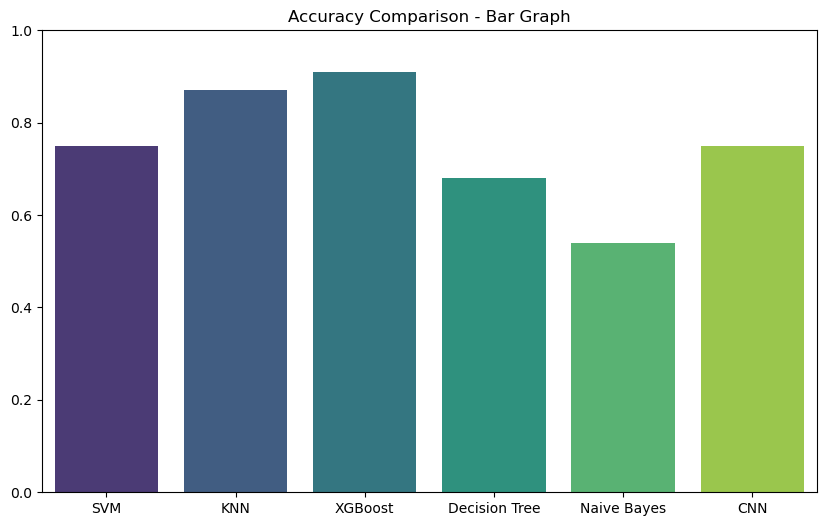

In [76]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming you have the accuracy values for each model
svm_accuracy = 0.75
knn_accuracy = 0.87
xgboost_accuracy = 0.91
decision_tree_accuracy = 0.68
naive_bayes_accuracy = 0.54
cnn_accuracy = 0.75

# Model names
model_names = ['SVM', 'KNN', 'XGBoost', 'Decision Tree', 'Naive Bayes', 'CNN']

# Accuracy values
accuracy_values = [svm_accuracy, knn_accuracy, xgboost_accuracy, decision_tree_accuracy, naive_bayes_accuracy, cnn_accuracy]

# Bar Graph
plt.figure(figsize=(10, 6))
sns.barplot(x=model_names, y=accuracy_values, palette='viridis')
plt.title('Accuracy Comparison - Bar Graph')
plt.ylim(0, 1)  # Set y-axis limit to represent accuracy values between 0 and 1
plt.show()

3.Line Plot

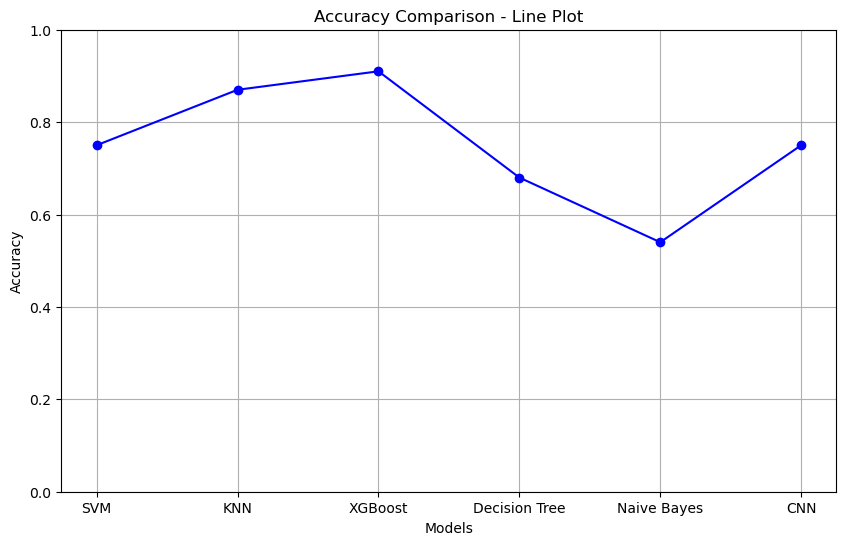

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming you have the accuracy values for each model
svm_accuracy = 0.75
knn_accuracy = 0.87
xgboost_accuracy = 0.91
decision_tree_accuracy = 0.68
naive_bayes_accuracy = 0.54
cnn_accuracy = 0.75

# Model names
model_names = ['SVM', 'KNN', 'XGBoost', 'Decision Tree', 'Naive Bayes', 'CNN']

# Accuracy values
accuracy_values = [svm_accuracy, knn_accuracy, xgboost_accuracy, decision_tree_accuracy, naive_bayes_accuracy, cnn_accuracy]
# Line Plot
plt.figure(figsize=(10, 6))
plt.plot(model_names, accuracy_values, marker='o', linestyle='-', color='b')
plt.title('Accuracy Comparison - Line Plot')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Set y-axis limit to represent accuracy values between 0 and 1
plt.grid(True)
plt.show()

# Recommender Systems

In [78]:
# First we will scale the data

import IPython.display as ipd
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import preprocessing

# Read data
data = pd.read_csv(f'{file_path}/features_30_sec.csv', index_col='filename')

# Extract labels
labels = data[['label']]

# Drop labels from original dataframe
data = data.drop(columns=['length','label'])

# Scale the data
data_scaled=preprocessing.scale(data)
print('Scaled data type:', type(data_scaled))

Scaled data type: <class 'numpy.ndarray'>


In [79]:
# Cosine similarity
similarity = cosine_similarity(data_scaled)
print("Similarity shape:", similarity.shape)

# Convert into a dataframe and then set the row index and column names as labels
sim_df_labels = pd.DataFrame(similarity)
sim_df_names = sim_df_labels.set_index(labels.index)
sim_df_names.columns = labels.index

sim_df_names.head()

Similarity shape: (1000, 1000)


filename,blues.00000.wav,blues.00001.wav,blues.00002.wav,blues.00003.wav,blues.00004.wav,blues.00005.wav,blues.00006.wav,blues.00007.wav,blues.00008.wav,blues.00009.wav,blues.00010.wav,blues.00011.wav,blues.00012.wav,blues.00013.wav,blues.00014.wav,blues.00015.wav,blues.00016.wav,blues.00017.wav,blues.00018.wav,blues.00019.wav,blues.00020.wav,blues.00021.wav,blues.00022.wav,blues.00023.wav,blues.00024.wav,blues.00025.wav,blues.00026.wav,blues.00027.wav,blues.00028.wav,blues.00029.wav,...,rock.00070.wav,rock.00071.wav,rock.00072.wav,rock.00073.wav,rock.00074.wav,rock.00075.wav,rock.00076.wav,rock.00077.wav,rock.00078.wav,rock.00079.wav,rock.00080.wav,rock.00081.wav,rock.00082.wav,rock.00083.wav,rock.00084.wav,rock.00085.wav,rock.00086.wav,rock.00087.wav,rock.00088.wav,rock.00089.wav,rock.00090.wav,rock.00091.wav,rock.00092.wav,rock.00093.wav,rock.00094.wav,rock.00095.wav,rock.00096.wav,rock.00097.wav,rock.00098.wav,rock.00099.wav
filename,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,1.000000,0.049231,0.589618,0.284862,0.025561,-0.346688,-0.219483,-0.167626,0.641877,-0.097889,-0.004725,-0.138701,0.022420,0.170770,-0.100287,-0.061984,0.038424,0.070591,-0.043250,-0.032994,0.506165,-0.103861,-0.153357,-0.021814,-0.068566,-0.103846,-0.286219,-0.017917,0.019182,-0.245793,...,-0.018038,0.616646,0.616184,0.619470,0.737537,0.391488,0.386102,0.524411,0.383944,0.635159,0.483003,0.338310,0.341182,0.704877,0.468150,-0.165756,-0.033461,0.655153,0.271846,0.484170,-0.082829,0.546169,0.578558,0.662590,0.571629,0.610942,0.640835,0.496294,0.284958,0.304098
blues.00001.wav,0.049231,1.000000,-0.096834,0.520903,0.080749,0.307856,0.318286,0.415258,0.120649,0.404168,0.187969,0.537564,0.116593,0.138999,0.372891,0.339293,0.243391,0.293110,0.242766,0.350323,0.173128,0.374270,0.433072,0.041210,0.293562,0.208121,0.265333,0.069686,0.193576,0.315657,...,-0.086265,-0.040695,-0.088279,-0.219520,-0.169743,0.043461,0.234076,-0.143892,0.226681,-0.234705,-0.254766,0.087614,-0.204128,-0.241611,-0.207278,0.031050,0.220761,-0.295174,-0.133969,0.047796,-0.098111,-0.325126,-0.370792,-0.191698,-0.330834,-0.077301,-0.222119,-0.302573,0.499562,0.311723
blues.00002.wav,0.589618,-0.096834,1.000000,0.210411,0.400266,-0.082019,-0.028061,0.104446,0.468113,-0.132532,0.220436,0.057667,0.214217,0.026326,-0.174039,-0.091717,0.042537,0.056512,-0.294934,0.037617,0.287231,-0.181328,-0.235117,0.129427,-0.020690,-0.191341,-0.372636,-0.058686,0.120372,0.075361,...,0.234224,0.450491,0.417995,0.488881,0.503598,0.348458,0.357615,0.455360,0.404612,0.631893,0.443831,0.326861,0.241868,0.550154,0.420591,0.109318,0.109191,0.594156,0.192450,0.566140,-0.032408,0.561074,0.590779,0.583293,0.514537,0.495707,0.566837,0.589983,0.216378,0.321069
blues.00003.wav,0.284862,0.520903,0.210411,1.000000,0.126437,0.134796,0.300746,0.324566,0.352758,0.295184,0.339783,0.414037,0.103369,0.220996,0.224956,0.228406,0.042363,0.261825,0.065738,0.303616,0.225934,0.248292,0.260467,0.101586,0.330638,0.255722,0.167251,0.160013,0.378844,0.163240,...,-0.314229,0.010499,0.061320,-0.050735,0.042413,-0.168371,0.291878,-0.034075,0.213593,-0.047289,-0.232775,-0.261782,-0.300883,-0.029997,-0.253542,-0.343440,-0.280107,-0.113291,-0.274467,0.285601,-0.320107,-0.206516,-0.151132,0.041986,-0.172515,-0.000287,0.020515,-0.107821,0.502279,0.183210
blues.00004.wav,0.025561,0.080749,0.400266,0.126437,1.000000,0.556066,0.482195,0.623455,0.029703,0.471657,0.425722,0.440986,0.375045,0.112140,-0.042368,0.160624,0.103306,0.137831,-0.088361,0.321315,0.019133,-0.042296,0.035282,0.138877,0.058387,-0.062569,-0.134307,0.079337,0.127336,0.419068,...,0.481840,-0.236271,-0.207946,-0.151639,-0.163956,-0.018372,0.075316,-0.122199,0.065956,0.126620,0.057758,0.171239,-0.041117,-0.007086,-0.006466,0.477521,0.256614,-0.076402,0.105612,0.368627,0.087605,0.017366,0.138035,0.104684,-0.034594,0.063454,0.063546,0.172944,0.153192,0.061785


In [80]:
def recommender(name):
    series = sim_df_names[name].sort_values(ascending = False)
    
    # Remove cosine similarity == 1 (songs will always have the best match with themselves)
    series = series.drop(name)
    topfive = series.head(5)
    songnames = topfive.index.tolist()
    address_list = [r"C:\Users\nisar\Tie_proj\Data\genres_original\blues",
                   r"C:\Users\nisar\Tie_proj\Data\genres_original\classical",
                   r"C:\Users\nisar\Tie_proj\Data\genres_original\country",
                  r"C:\Users\nisar\Tie_proj\Data\genres_original\disco",
                r"C:\Users\nisar\Tie_proj\Data\genres_original\hiphop",
                   r"C:\Users\nisar\Tie_proj\Data\genres_original\jazz",
                   r"C:\Users\nisar\Tie_proj\Data\genres_original\metal",
                  r"C:\Users\nisar\Tie_proj\Data\genres_original\pop",
                 r"C:\Users\nisar\Tie_proj\Data\genres_original\reggae",
                   r"C:\Users\nisar\Tie_proj\Data\genres_original\rock"]
    genre_list = ["blues", "classical", "country", "disco", 
                  "hiphop", "jazz", "metal", "pop", "reggae", "rock"]
    songlist = []
    songnames = []
    for songname in topfive.index:
        songgenre = songname.split('.')[0]
        address = genre_list.index(songgenre)
        fileaddress = address_list[address] + ('/') + songname
        songlist.append(fileaddress)
        songnames.append(songname)
    return songlist, songnames

In [81]:
now_playing = 'rock.00003.wav'
playlist, songname = recommender(now_playing)
print('Now playing:', now_playing)
ipd.Audio(r"C:\Users\nisar\Tie_proj\Data\genres_original\rock\rock.00003.wav")

Now playing: rock.00003.wav


In [82]:
print('Recommended songs:\n\n', pd.Series(songname))
ipd.Audio(playlist[0])

Recommended songs:

 0    blues.00003.wav
1     rock.00004.wav
2     rock.00002.wav
3     rock.00001.wav
4    blues.00091.wav
dtype: object


# User voice detection with waveform

In [1]:
!pip install sounddevice

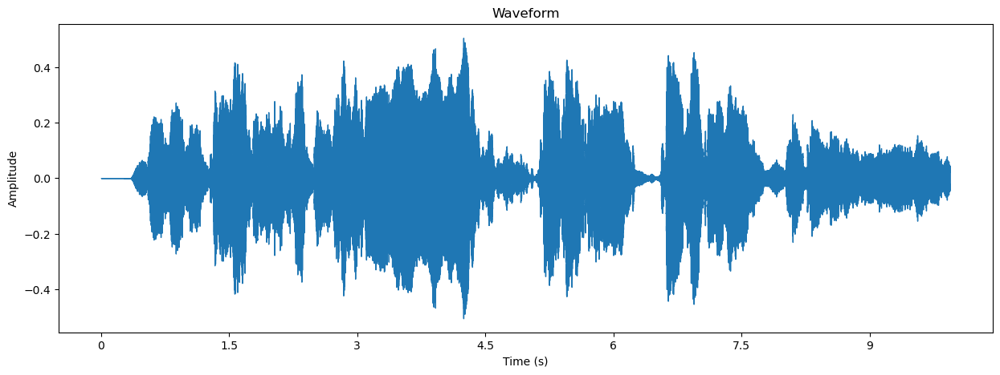

In [2]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import sounddevice as sd
import IPython.display as ipd 

audio_file_path = r"C:\Users\nisar\Tie_proj\Feels.wav"
audio_data, sample_rate = librosa.load(audio_file_path)

# Display the waveform
plt.figure(figsize=(15, 5))
librosa.display.waveshow(audio_data, sr=sample_rate)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()


# Lets play the audio 
ipd.Audio(audio_file_path)
